# Visualizing genomic regions of Pf8 samples with IGV-notebook 

## Introduction

This notebook aims to demonstrate the visualization of genomic regions in Pf8 samples using the [igv-notebook library](https://github.com/igvteam/igv-notebook). `igv-notebook` facilitates the creation of Integrative Genomics Viewer (IGV) plots with the ability to access CRAM files from the cloud without the need for downloads.

**About Pf8 CRAM files**: Compressed Reference-oriented Alignment Map (CRAM) is  a more highly compressed alternative to the BAM and SAM DNA sequence alignment file formats. Pf8 CRAM archive is publicly available at: https://pf8-release.cog.sanger.ac.uk/index.html

We will start understanding igv plots and its setup. Then, we will show examples from impactful genes of *Plasmodium falciparum*.

### What is IGV Plot

IGV software, along with its Python library igv_notebook, has been developed by researchers at UC San Diego and the Broad Institute of MIT and Harvard. It is designed for the interactive visual exploration of genomic data and is freely available under the MIT open-source license.

IGV plot primarily showcases the alignment of sequencing reads to a reference genome. Here is a snapshot of a IGV plot: 

![image](/images/igv_plot.png)

Let's go through what each track <font color="red">(red annotations in the picture)</font> shows:

**Reference:** Helps to identify variants in the reads track.

**Annotation:** Shows which gene you are looking to.

**Coverage:**  Number of reads covering that position, varied coverage patterns may signify regions of interest or potential structural variants.

**Reads & variants:** Single nucleotide polymorphisms are highlighted, and deletions can be seen as empty.

Intereactive features of IGV plot <font color="blue">(blue texts in the picture)</font>, exploring with zooming, scrolling, locus specifiying features are essentialy useful viewing neighboring locations, .

Other resources related to basics of IGV plot:


- The IGV desktop application documentation offers valuable insights into IGV plots and interactive features, some of which are also applicable to igv-notebook: https://igv.org/doc/desktop/
- Matt Eldridge inspects variants in IGV to whether these are real events or artifacts: https://bioinformatics-core-shared-training.github.io/intro-to-IGV/InspectingVariantsInIGV.html

### Setup: Install igv-notebook

First of all, we need to install and import `igv_notebook` python package.

In [1]:
!pip install igv_notebook
import igv_notebook


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python3.11 -m pip install --upgrade pip


We will also require 3D7 reference annotation file to annotate genes in the IGV, and the 3D7 reference genome fasta file used for mapping of Pf8 samples. Both of these files are accessible through Sanger's cloud storage, thus, we don't need to download them here.

### Creation of IGV Plot using Pf8 Data

To initialise an IGV browser, we need to populate a configuration dictionary with essential file paths that will be utilized to load genomic data.

We also need to define a specific genomic location, identified by the chromosome ID, starting base coordinate, and ending base coordinate to allow the browser to commence at the desired genomic position.

We will create a function to streamline this process.

In [3]:
def sample_viewer(sample_id, chromosome, start_base_coordinate, end_base_coordinate, showSoftClips=False):
  """
    Visualize genomic data using IGV_notebook.

    Parameters:
    - sample_id (str): Sample ID for the sample.
    - chromosome (int): The chromosome number.
    - start_base_coordinate (int): The starting base coordinate for visualization.
    - end_base_coordinate (int): The ending base coordinate for visualization.

    Returns:
    - igv_plot: IGV Browser object for further interaction.
  """

  # Define the genomic locus formatted for igv-notebook
  locus = f'Pf3D7_{str(chromosome).zfill(2)}_v3:{start_base_coordinate:,}-{end_base_coordinate:,}'
  print(f'Visualizing chromosome {chromosome} for genomic locus: {locus}')

  # Initialize the browser
  igv_notebook.init()
  igv_plot = igv_notebook.Browser(

    {
        "locus": locus,
            "tracks": [

            {
                "name": "Annotations",
                "url": 'https://pf8-release.cog.sanger.ac.uk/annotations/PlasmoDB-55_Pfalciparum3D7.gff.gz',
                "indexed": False,
                "type": "annotation",
                "format": "gff"
            },
            {
                "name": "CRAM",
                "url": f"https://pf8-release.cog.sanger.ac.uk/cram/{sample_id}.cram",
                "indexURL": f"https://pf8-release.cog.sanger.ac.uk/cram/{sample_id}.cram.crai",
                "format": "cram",
                "type": "alignment",
                "showSoftClips": showSoftClips,
            },
        ],

        # Load the reference
        "reference": {
           "fastaURL": 'https://pf8-release.cog.sanger.ac.uk/reference/PlasmoDB-54-Pfalciparum3D7-Genome.fasta',
           "indexed": False, # reads entire fasta
        },
    })

  return igv_plot

We are ready to use our function to show examples from Pf8 on some impactful events.

## Examples from Pf8

### *hrp2* deletions

*hrp2* and *hrp3* are genes located in subtelomeric regions of the genome with very high levels of natural variation. Deletion in those genes can cause failure of rapid diagnostic tests and is therefore important to monitor.

We will specify the sample and navigate to a genomic location where *hrp2* deletion is expected.

In [4]:
sample_viewer('PP0026-C', 8, 1374970, 1375040, showSoftClips=True)

Visualizing chromosome 8 for genomic locus: Pf3D7_08_v3:1,374,970-1,375,040


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

From this view, we can see that all the reads are deleted from position 1,374,987 bp onwards (click, hold and drag left to see the other reads).

If we scroll down in the IGV plot, we can clearly see the sequence clipped from these mappings is the telomere repeat sequence GGGTT(T/C)A.

Let's zoom out a bit to have a clear view by defining a range (1kb) that includes the deletion locus. The breakpoint will be seen before 1,374,850 bp and after 1,374,950 bp.

In [ ]:
sample_viewer('PP0026-C', 8, 1374800, 1375079)

Visualizing chromosome 8 for genomic locus: Pf3D7_08_v3:1,374,800-1,375,079


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### *hrp3* deletions


Let's look at a different example of a deletion. We will navigate to *hrp3* where we expect to see deletion of the whole gene. In this example, we can also see the deletion of other neighbouring genes (PF3D7_1372100, PF3D7_1372000) in addition to *hrp3*.

In [ ]:
sample_viewer('PD0129-C', 13, 2840236,2842840)

Visualizing chromosome 13 for genomic locus: Pf3D7_13_v3:2,840,236-2,842,840


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### MDR1 Duplication

Duplication of the MDR1 gene can lead to resistance to antimalarial drugs, including artemisinin-based combination therapies (ACTs).

Before looking at a Pf8 sample for MDR1 duplication, let's discuss what we expect to see in the IGV plot:

- Increase in the coverage track.

- IGV uses color coding to flag anomalous insert sizes. Red flags are inferred for an insert size that is larger than expected (possible of a deletion).

- Read orientation of paired reads is normally expected as left versus right,and right to left orientation implies duplication or translocation with respect to reference.  

- When a large section of DNA is duplicated and inserted into the genome next to the original sequence, it will be shown as below.

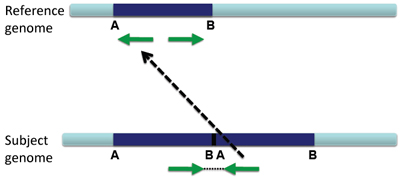

Figure credit: [IGV User Guide](https://igv.org/doc/desktop/)

Now, let's look at the plot and notice the increase in the coverage where MDR1 starts (after 955kb). Also, when we zoom-in in the MDR1, we can see many red flags with the right to left orientation. Notably, two neighboring genes (PF3D7_0523100 and PF3D7_0523200) also share these findings.

In [8]:
sample_viewer('PD0131-C', 5, 941041, 969604)

Visualizing chromosome 5 for genomic locus: Pf3D7_05_v3:941,041-969,604


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Plasmepsin 2/3 Duplication

Duplication of the Plasmepsin 2/3 gene can lead to resistance to piperaquine, a partner drug used in artemisinin-based combination therapies (ACTs).

We will showcase two samples from Pf8 where we observed a duplication event. In addition to the red reads (insertions) with orientations right versus left, there are numerous left versus right reads indicating an insertion into the genome, marked in green at the genomic location of 298-299 kb.

Also note that the coverage of Plasmepsin 2/3 gene (3892) is 2-5 times more than the neighbour genes.

In [ ]:
sample_viewer('PG0607-C', 14, 295000, 302000)

Visualizing chromosome 14 for genomic locus: Pf3D7_14_v3:295,000-302,000


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Let's look at the duplication at the second sample in genomic locus close to 299kb.

In [ ]:
sample_viewer('PG0609-C', 14, 293000, 300000)

Visualizing chromosome 14 for genomic locus: Pf3D7_14_v3:293,000-300,000


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Along with these insertions, we can also see from the plots that there are breakpoints close to MDR1. A breakpoint represents a genomic position where structural variation occurs, such as a duplication. We will zoom into sample 1 and sample 2 to note the starting position of the breakpoint.

The breakpoint in the first sample starts around 297,350bp.

In [ ]:
sample_viewer('PG0607-C', 14, 297200, 299000)

Visualizing chromosome 14 for genomic locus: Pf3D7_14_v3:297,200-299,000


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

The breakpoint in the second sample starts around 297,300bp, 60 base pairs behind from the first sample.

In [ ]:
sample_viewer('PG0609-C', 14, 297200, 299000)

Visualizing chromosome 14 for genomic locus: Pf3D7_14_v3:297,200-299,000


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### CRT 72-76 Haplotype

In the last example, we will look at a CRT 72-76 haplotype, which is a genetic marker associated with resistance to chloroquine, an antimalarial drug. The haplotype is a combination of amino acid residues at positions 72 to 76 in the P. falciparum chloroquine-resistance transporter (pfcrt) gene.

In the IGV plot genomic locations 403,620-403,625 bp, we can see while some reads don't have any SNP, other reads have the following 4 SNPs: 403620 G>T, 403621 A>G, 403624 T>A, 403625 A>C. These four SNPs indicates a variation from the reference genome (3D7) and makes the CVIET haplotype.



In [ ]:
sample_viewer('FP0025-C', 7, 403600, 403650)

Visualizing chromosome 7 for genomic locus: Pf3D7_07_v3:403,600-403,650


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Conclusion



In summary, you can visualise genomic variation in any Pf8 sample, by simply specifying sample ID, gene, and locus information to the `sample_viewer` function in this notebook.

